TAREA

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

In [ ]:
def histogram_equalization(image):
    histogram, bins = np.histogram(image.ravel(), bins=256, range=[0,256])
    npixels = image.shape[0] * image.shape[1]
    # Inicializar el arreglo
    eq_hist = np.zeros_like(histogram, dtype=np.uint8)

    acumulado = histogram[0]
    i = 1
    while i <= 254:
        eq_hist[i] = (acumulado * 255 // npixels)
        acumulado += histogram[i]
        i += 1

    eq_hist[0] = 0
    eq_hist[255] = 255

    return eq_hist

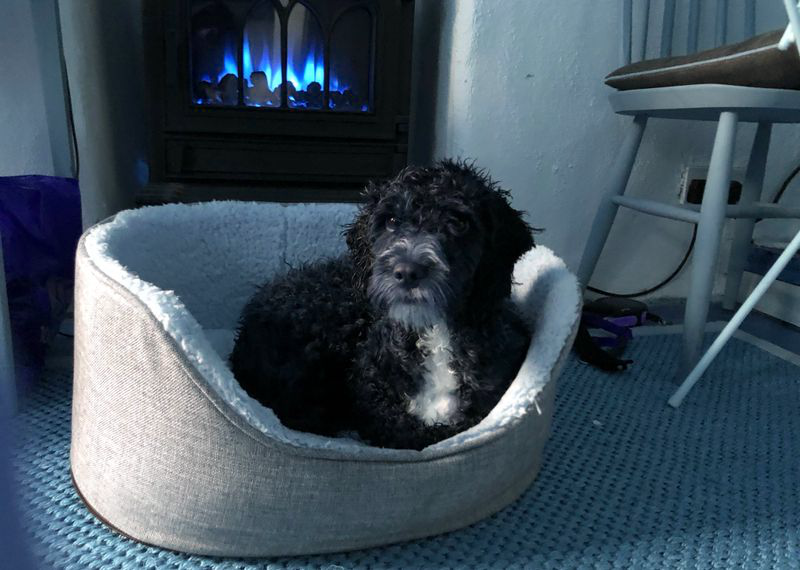

In [ ]:
urldog = "https://place.dog/800/570"
imagedog = io.imread(urldog) 
cv2_imshow(imagedog)

In [ ]:
eq_hist = histogram_equalization(imagedog)
img_eq_otro = eq_hist[imagedog]

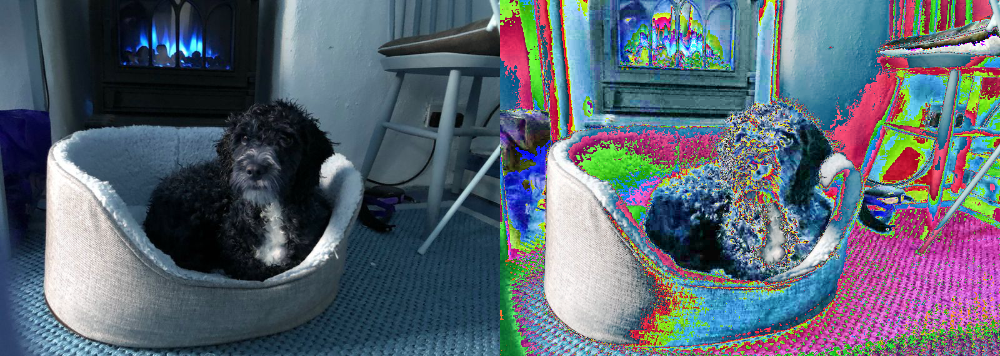

In [ ]:
final_frame = cv.hconcat((imagedog, img_eq_otro))
cv2_imshow(final_frame)

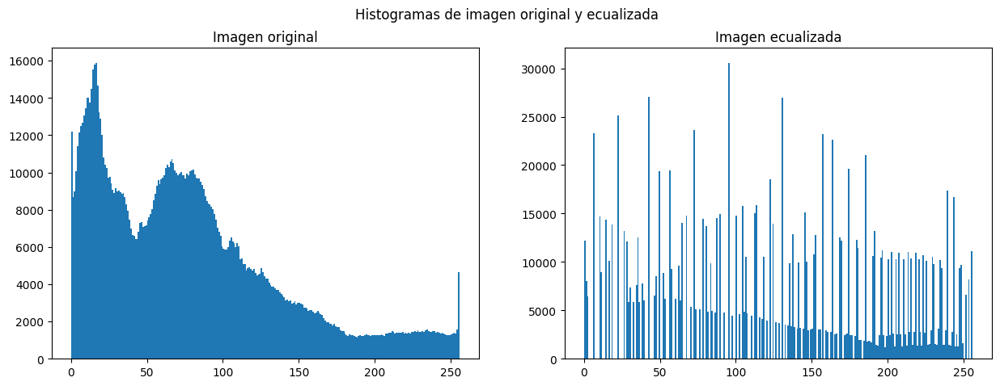

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Histogramas de imagen original y ecualizada')

axes[0].hist(imagedog.ravel(),bins = 256, range = [0,256])
axes[0].set_title('Imagen original')

axes[1].hist(img_eq_otro.ravel(),bins = 256, range = [0,256])
axes[1].set_title('Imagen ecualizada')

plt.show()

**OPERACIONES ARITMETICAS**

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

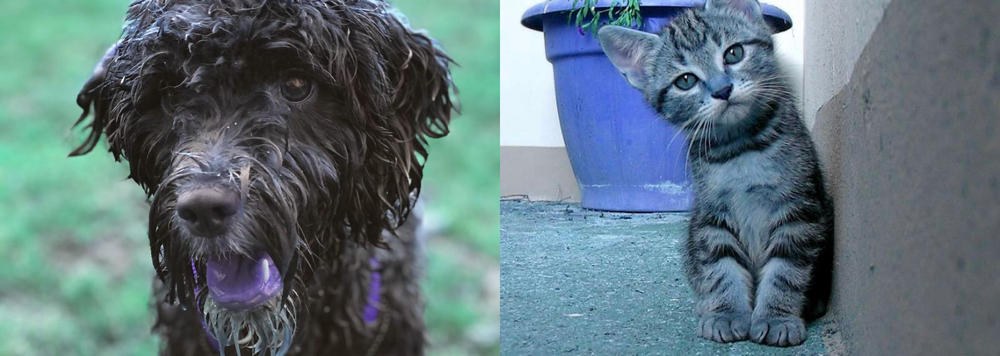

In [ ]:
url1 = "https://place.dog/800/570"
url2 = "https://placekitten.com/800/570"
imagen1 = io.imread(url1) 
imagen2 = io.imread(url2)
final_frame = cv.hconcat((imagen1, imagen2))
cv2_imshow(final_frame)

In [ ]:
imagen1.shape

(570, 800, 3)

**SUMA**

In [ ]:
def sum_images(image1, image2):
    if image1.shape != image2.shape:
        print("Las imágenes no tienen el mismo tamaño")
    else:
      # Sumar las imágenes de forma modular
        image_sum = image1 + image2
    return image_sum

imagen_sum_f = sum_images(imagen1, imagen2)

final_frame = cv.hconcat((imagen1, imagen2,imagen_sum_f))
cv2_imshow(final_frame)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def add_images(image1, image2):
    if image1.shape != image2.shape:
        print("Las imágenes no tienen el mismo tamaño")
    # Sumar las imágenes de forma saturada
    result = np.zeros_like(image1)
    result = image1.astype(int) + image2.astype(int)
    result = np.where(result < 0, 0, result)
    result = np.where(result > 255, 255, result)
    result = result.astype('uint8')

    return result

In [ ]:
imagen_sum_f = add_images(imagen1, imagen2)

final_frame = cv.hconcat((imagen1, imagen2,imagen_sum_f))
cv2_imshow(final_frame)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 
if imagen1.shape != imagen2.shape:
    print("Las imágenes no tienen el mismo tamaño")
else:
    imagen_sum = cv.add(imagen1, imagen2)

final_frame = cv.hconcat((imagen1, imagen2,imagen_sum))
cv2_imshow(final_frame)

Output hidden; open in https://colab.research.google.com to view.

**RESTA**

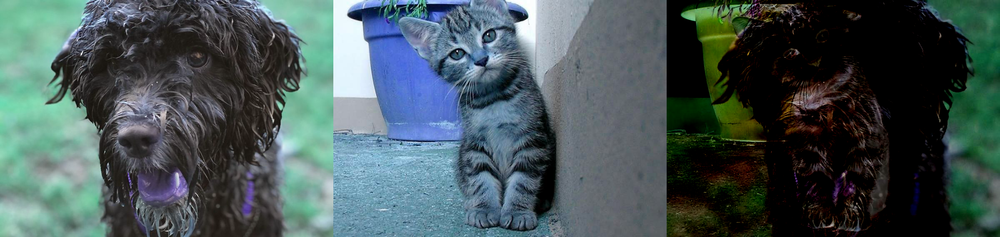

In [ ]:
def resta_images(image1, image2):
    if image1.shape != image2.shape:
        print("Las imágenes no tienen el mismo tamaño")
    else:
        result = np.zeros_like(image1)
        result = image1.astype(int) - image2.astype(int)
        result = np.where(result < 0, 0, result)
        result = np.where(result > 255, 255, result)
        result = result.astype('uint8')
    return result

imagen_resta = resta_images(imagen1, imagen2)

final_frame = cv.hconcat((imagen1, imagen2,imagen_resta))
cv2_imshow(final_frame)

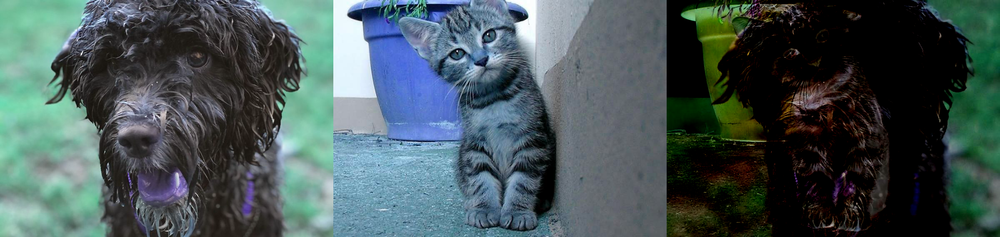

In [ ]:
if imagen1.shape != imagen2.shape:
    print("Las imágenes no tienen el mismo tamaño")
else:
    imagen_sub = cv.subtract(imagen1, imagen2)

final_frame = cv.hconcat((imagen1, imagen2,imagen_sub))
cv2_imshow(final_frame)

**MEDIA**

In [ ]:
def media(image1, image2):
    if image1.shape != image2.shape:
        print("Las imágenes no tienen el mismo tamaño")
    else:
        result = np.zeros_like(image1)
        result = (image1.astype(int) + image2.astype(int))//2
        result = np.where(result < 0, 0, result)
        result = np.where(result > 255, 255, result)
        result = result.astype('uint8')
    return result

imagen_resta = media(imagen1, imagen2)

final_frame = cv.hconcat((imagen1, imagen2,imagen_resta))
cv2_imshow(final_frame)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
if imagen1.shape != imagen2.shape:
    print("Las imágenes no tienen el mismo tamaño")
else:
    imagen_add_2 = cv.add(imagen1, imagen2)//2

final_frame = cv.hconcat((imagen1, imagen2,imagen_add_2))
cv2_imshow(final_frame)

Output hidden; open in https://colab.research.google.com to view.

**MEDIA PONDERADA**

In [ ]:
def media_ponderada(image1, image2):
    if image1.shape != image2.shape:
        print("Las imágenes no tienen el mismo tamaño")
    else:
        a=0.7
        result = np.zeros_like(image1)
        result = image1.astype(int)*a + image2.astype(int)*(1-a)
        result = np.where(result < 0, 0, result)
        result = np.where(result > 255, 255, result)
        result = result.astype('uint8')
    return result

imagen_resta = media_ponderada(imagen1, imagen2)

final_frame = cv.hconcat((imagen1, imagen2,imagen_resta))
cv2_imshow(final_frame)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
if imagen1.shape != imagen2.shape:
    print("Las imágenes no tienen el mismo tamaño")
else:
    a=0.7
    imagen_ =cv.addWeighted(imagen1,a,imagen2,1-a,0)

final_frame = cv.hconcat((imagen1, imagen2,imagen_))
cv2_imshow(final_frame)

Output hidden; open in https://colab.research.google.com to view.

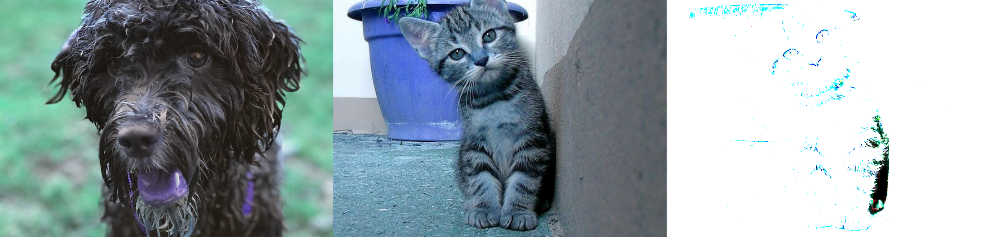

In [ ]:
def mezcla(image1, image2):
    if image1.shape != image2.shape:
        print("Las imágenes no tienen el mismo tamaño")
    else:
        a=0.4
        result = np.zeros_like(image1)
        result = image1.astype(int)*image2.astype(int)*a
        result = np.where(result < 0, 0, result)
        result = np.where(result > 255, 255, result)
        result = result.astype('uint8')
    return result

imagen_resta = mezcla(imagen1, imagen2)

final_frame = cv.hconcat((imagen1, imagen2,imagen_resta))
cv2_imshow(final_frame)

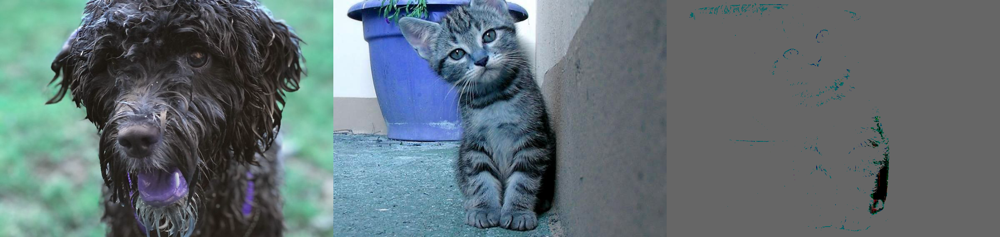

In [ ]:
if imagen1.shape != imagen2.shape:
    print("Las imágenes no tienen el mismo tamaño")
else:
    a=0.4
    imagen_ =cv.multiply(cv.multiply(imagen1,imagen2),(a,a,a,a))

final_frame = cv.hconcat((imagen1, imagen2,imagen_))
cv2_imshow(final_frame)

**CONVOLUCION**

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt


In [ ]:
url1 = "https://place.dog/800/570"
img = io.imread(url1) 

In [ ]:
def convolve_np(img, kernel):
    h, w = img.shape
    k_h, k_w = kernel.shape
    pad_h, pad_w = k_h // 2, k_w // 2
    
    #img_padded = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), 'edge')
    img_padded = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), 'constant', constant_values=0)
    out = np.zeros_like(img)
    
    for i in range(h):
        for j in range(w):
            # Extrae la región de interés
            roi = img_padded[i:i+k_h, j:j+k_w]
            
            # Aplica el kernel y redondea al entero superior
            conv_sum = np.sum(roi * kernel)
            out[i, j] = np.ceil(conv_sum)
      
    return out

In [ ]:
kernelx = np.array([[-1, 0, 1], [-1, 0, 1],[-1,0,1]])
kernel_enfoque = np.array([[0, -1, 0], [-1, 5, -1],[0,-1,0]])
kernel_desenfoque = np.array([[1, 1, 1], [1,1, 1],[1,1,1]])
kernel_realce_bordes = np.array([[0, 0, 0], [-1,1, 0],[0,0,0]])
kernel_detec_bordes = np.array([[0, 1, 0], [1,-4, 1],[0,1,0]])
kernel_sharpen = np.array([[1, -2, 1], [-2, 5, -2],[1, -2, 1]])
kernel_filtroPA= np.array([[-1, -1, -1], [-1, 8, -1],[-1, -1, -1]])


CONVOLUCION IMAGEN EN ESCALA DE GRISES

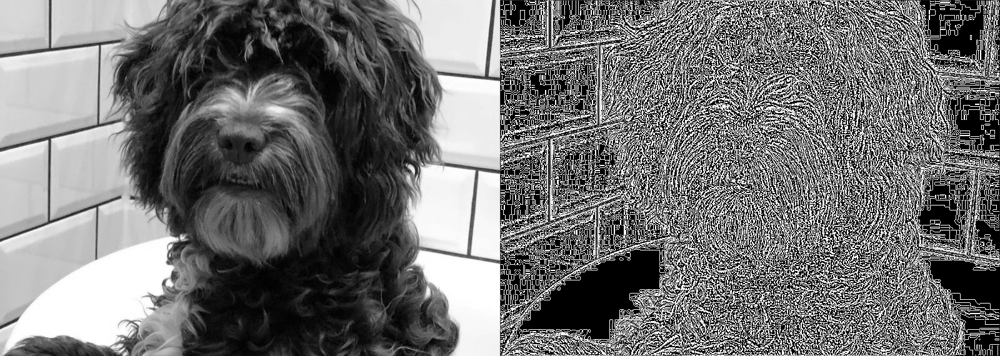

In [ ]:
gray_image = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
result = convolve_np(gray_image, kernel_detec_bordes)


final_frame = cv.hconcat((gray_image, result))
cv2_imshow(final_frame)

CONVOLUCION IMAGEN A COLORES

In [ ]:
def convolve_np_rgb(img, kernel):
    h, w, c = img.shape
    k_h, k_w = kernel.shape
    pad_h, pad_w = k_h // 2, k_w // 2
    
    img_padded = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w), (0, 0)), 'constant', constant_values=0)
    out = np.zeros_like(img)
    
    for ch in range(c):
        for i in range(h):
            for j in range(w):
                # Extrae la región de interés del canal actual
                roi = img_padded[i:i+k_h, j:j+k_w, ch]
            
                # Aplica el kernel y redondea al entero superior
                conv_sum = np.sum(roi * kernel)
                out[i, j, ch] = np.ceil(conv_sum)
    
    return out


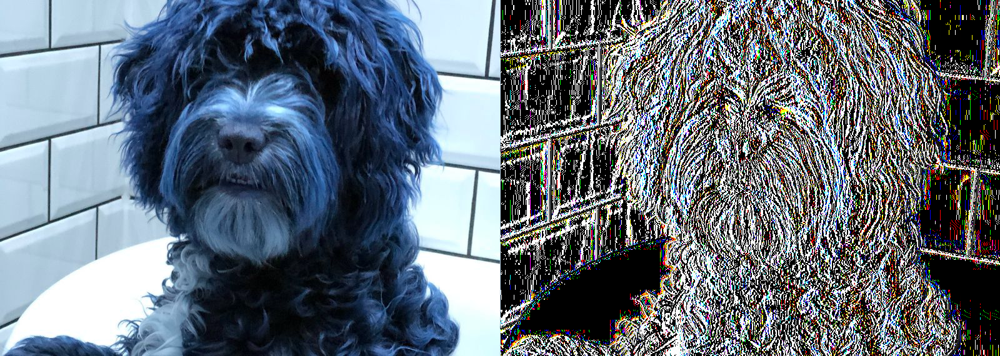

In [ ]:
result = convolve_np_rgb(img, kernel_realce_bordes)


final_frame = cv.hconcat((img, result))
cv2_imshow(final_frame)

**FILTRO MEDIANA**

In [ ]:
def median_filter(image, kernel_size):
    padding = kernel_size // 2
    height, width = image.shape[:2]
    #image_padded = np.pad(image, ((padding,), (padding,), (0,)), 'constant', constant_values=0)
    image_padded = np.pad(image, ((padding,), (padding,), (0,)), mode='edge')
    output = np.zeros_like(image)
    
    for i in range(height):
        for j in range(width):
            roi = image_padded[i:i+kernel_size, j:j+kernel_size, :]
            median = np.median(roi, axis=(0, 1))
            output[i, j] = median
    
    return output

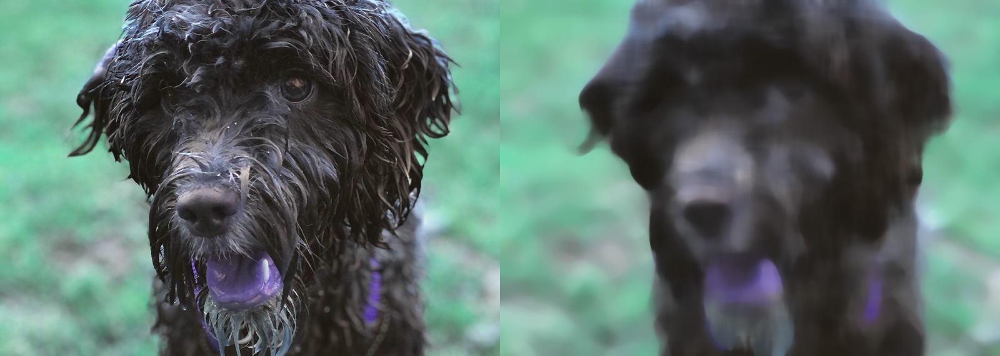

In [ ]:
result = median_filter(img, 30)


final_frame = cv.hconcat((img, result))
cv2_imshow(final_frame)

**ZOOM CON INTERPOLACION BILINEAL**

In [ ]:
def zoom_bilinear(img, scale_factor):
    height, width = img.shape[:2]
    
    #dimensiones de la imagen con el factor de escala
    new_height, new_width = int(height * scale_factor), int(width * scale_factor)
    
    output = np.zeros((new_height, new_width, img.shape[2]), dtype=np.uint8)
    
    #índices de los píxeles de la imagen de salida
    x_ratio = float(width - 1) / (new_width - 1)
    y_ratio = float(height - 1) / (new_height - 1)
    
    for i in range(new_height):
        for j in range(new_width):
            x = x_ratio * j
            y = y_ratio * i
            x1 = int(x)
            y1 = int(y)
            x2 = min(x1 + 1, width - 1)
            y2 = min(y1 + 1, height - 1)

            #interpolación bilineal
            f11 = img[y1, x1]
            f21 = img[y1, x2]
            f12 = img[y2, x1]
            f22 = img[y2, x2]

            tx = x - x1
            ty = y - y1

            w1 = (1 - tx) * (1 - ty)
            w2 = tx * (1 - ty)
            w3 = (1 - tx) * ty
            w4 = tx * ty

            output[i, j] = (w1 * f11 + w2 * f21 + w3 * f12 + w4 * f22).astype(np.uint8)

    return output

In [ ]:
result = zoom_bilinear(img, 3)
result = np.ma.filled(result,0).astype('uint8')

#final_frame = cv.hconcat((img, result))
#cv2_imshow(final_frame)
cv2_imshow(img)
cv2_imshow(result)

Output hidden; open in https://colab.research.google.com to view.

**ZOOM CON INTERPOLACION CUBICA**

In [ ]:
def cubic_interpolate(p, x):
    # coeficientes de interpolación cúbica
    a = -0.5*p[0] + 1.5*p[1] - 1.5*p[2] + 0.5*p[3]
    b = p[0] - 2.5*p[1] + 2*p[2] - 0.5*p[3]
    c = -0.5*p[0] + 0.5*p[2]
    d = p[1]
    
    return a*x**3 + b*x**2 + c*x + d

def zoom_cubic(img, scale_factor):
    height, width = img.shape[:2]
    
    new_height, new_width = int(height * scale_factor), int(width * scale_factor)
    
    # matriz vacía para la imagen escalada
    output = np.zeros((new_height, new_width, img.shape[2]), dtype=np.uint8)
    
    # índices de los píxeles de la imagen escalada
    x_ratio = float(width - 1) / (new_width - 1)
    y_ratio = float(height - 1) / (new_height - 1)
    
    for i in range(new_height):
        for j in range(new_width):
            x = x_ratio * j
            y = y_ratio * i
            
            # coordenadas de los 16 píxeles cercanos
            x_min = int(x) - 1
            y_min = int(y) - 1
            
            # valores de los 16 píxeles cercanos
            pixels = np.zeros((4, 4, img.shape[2]), dtype=np.uint8)
            for k in range(4):
                for l in range(4):
                    x_coord = x_min + l
                    y_coord = y_min + k
                    if x_coord >= 0 and x_coord < width and y_coord >= 0 and y_coord < height:
                        pixels[k, l] = img[y_coord, x_coord]
            
            # distancia entre el píxel de salida y los píxeles cercanos
            x_diff = x - x_min
            y_diff = y - y_min
            
            # valores de los píxeles cercanos interpolados en x
            x_interp = np.zeros((4, img.shape[2]), dtype=np.float32)
            for k in range(4):
                x_interp[k] = cubic_interpolate(pixels[k], x_diff)
            
            # valor del píxel de salida interpolado en y
            output[i, j] = cubic_interpolate(x_interp, y_diff)
    
    return output



In [ ]:
result = zoom_cubic(img, 2)

#final_frame = cv.hconcat((img, result))
#cv2_imshow(final_frame)
cv2_imshow(img)
cv2_imshow(result)

Output hidden; open in https://colab.research.google.com to view.